In [2]:
#Install OPENCV
!pip install opencv-python
!pip list

  Obtaining dependency information for opencv-python from https://files.pythonhosted.org/packages/c7/ec/9dabb6a9abfdebb3c45b0cc52dec901caafef2b2c7e7d6a839ed86d81e91/opencv_python-4.9.0.80-cp37-abi3-win_amd64.whl.metadata
   ---------------------------------------- 0.0/38.6 MB ? eta -:--:--
   ---------------------------------------- 0.0/38.6 MB ? eta -:--:--
   ---------------------------------------- 0.0/38.6 MB ? eta -:--:--
   ---------------------------------------- 0.0/38.6 MB 435.7 kB/s eta 0:01:29
   ---------------------------------------- 0.0/38.6 MB 435.7 kB/s eta 0:01:29
   ---------------------------------------- 0.0/38.6 MB 435.7 kB/s eta 0:01:29
   ---------------------------------------- 0.0/38.6 MB 164.3 kB/s eta 0:03:55
   ---------------------------------------- 0.1/38.6 MB 269.5 kB/s eta 0:02:24
   ---------------------------------------- 0.1/38.6 MB 328.2 kB/s eta 0:01:58
   ---------------------------------------- 0.1/38.6 MB 327.4 kB/s eta 0:01:58
   -------------

**OPERACIONES PUNTUALES EN IMAGENES**

Binarización

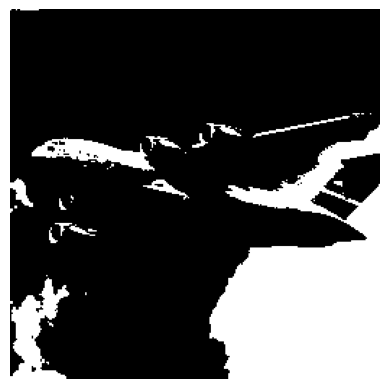

In [26]:
#Binarizing Images - Given an image, you want to output a simplified version.

# Tresholding is the process of setting pixels with intensity greater than some value to
# be white and less than the value to be black. 

# Load the image in grayscale
image = cv2.imread('sim_data-master/images/plane_256x256.jpg', cv2.IMREAD_GRAYSCALE)

# Define the threshold value
threshold_value = 150

# Apply hard thresholding
ret, thresholded_image = cv2.threshold(image, threshold_value, 255, cv2.THRESH_BINARY)

# Show image
plt.imshow(thresholded_image, cmap="gray"), plt.axis("off")
plt.show()

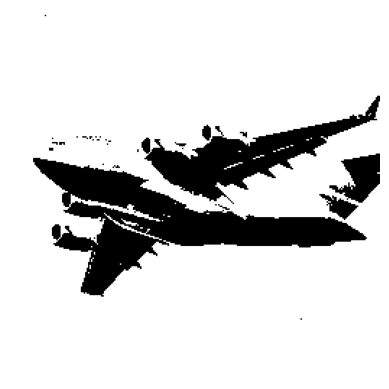

In [27]:
# A more advanced technique is adaptive thresholding, 
# where the threshold value for a pixel is determined by the pixel intensi‐
# ties of its neighbors. This can be helpful when lighting conditions change over differ‐
# ent regions in an image

# Load libraries
import cv2
import numpy as np
from matplotlib import pyplot as plt
# Load image as grayscale
image_grey = cv2.imread("sim_data-master/images/plane_256x256.jpg", cv2.IMREAD_GRAYSCALE)

# Apply adaptive thresholding
max_output_value = 255
neighborhood_size = 99
subtract_from_mean = 10
image_binarized = cv2.adaptiveThreshold(image_grey,
 max_output_value,
cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
cv2.THRESH_BINARY,
neighborhood_size,
subtract_from_mean)
# Show image
plt.imshow(image_binarized, cmap="gray"), plt.axis("off")
plt.show()

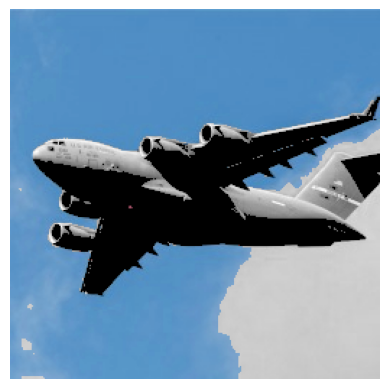

In [28]:
#Hard threshold in color image using HSV

# Load the color image
image = cv2.imread('sim_data-master/images/plane_256x256.jpg')

# Convert the image to the HSV color space
hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Define the threshold values for each channel (H, S, V)
h_threshold = 100  # Example threshold for H channel
s_threshold = 100  # Example threshold for S channel
v_threshold = 100  # Example threshold for V channel

# Apply hard thresholding to each channel
hsv_image[:, :, 0] = np.where(hsv_image[:, :, 0] > h_threshold, hsv_image[:, :, 0], 0)
hsv_image[:, :, 1] = np.where(hsv_image[:, :, 1] > s_threshold, hsv_image[:, :, 1], 0)
hsv_image[:, :, 2] = np.where(hsv_image[:, :, 2] > v_threshold, hsv_image[:, :, 2], 0)

# Convert the modified HSV image back to BGR color space
thresholded_image = cv2.cvtColor(hsv_image, cv2.COLOR_HSV2RGB)

# Show image
plt.imshow(thresholded_image), plt.axis("off")
plt.show()


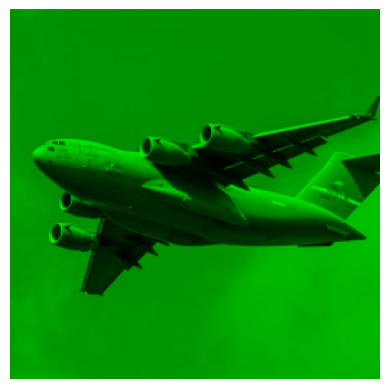

In [29]:
#Hard threshold in color image using RGB

# Load the color image
image = cv2.imread('sim_data-master/images/plane_256x256.jpg')

# Define the threshold values for each channel (R, G, B)  # CHANGE THESE VALUES
# Each value greater than the threshold will be replaced by 0

r_threshold = 255  # Example threshold for R channel   
g_threshold = 0  # Example threshold for G channel
b_threshold = 255  # Example threshold for B channel

# # Split the image into its RGB channels
r_channel, g_channel, b_channel = cv2.split(image)

# Apply hard thresholding to each channel
r_channel = np.where(r_channel > r_threshold, r_channel, 0)
g_channel = np.where(g_channel > g_threshold, g_channel, 0)
b_channel = np.where(b_channel > b_threshold, b_channel, 0)

# Merge the modified channels back into an RGB image
thresholded_image = cv2.merge((r_channel, g_channel, b_channel))

# Show image
plt.imshow(thresholded_image), plt.axis("off")
plt.show()

Negativo de la imagen

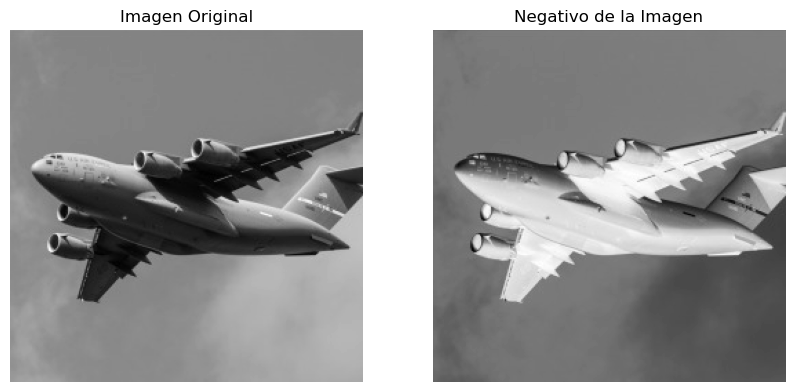

In [23]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load image as grayscale
image = cv2.imread("sim_data-master/images/plane_256x256.jpg", cv2.IMREAD_GRAYSCALE)

# Encontrar el negativo de la imagen
image_negative = 255 - image

# Mostrar la imagen original y su negativo
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap="gray")
plt.title("Imagen Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(image_negative, cmap="gray")
plt.title("Negativo de la Imagen")
plt.axis("off")

plt.show()

A logarithmic transformation is a common image enhancement technique used to increase the visibility of details in darker regions of an image. It's particularly useful when the dynamic range of pixel values is skewed towards lower values.

In this code, the np.log1p() function is used to apply the logarithmic transformation to the pixel values of the image. The log1p() function calculates the natural logarithm of each pixel value plus 1, which helps handle the case where pixel values are 0. The transformed image is then normalized to the range [0, 255] to ensure it can be displayed as an image. Finally, the original and transformed images are displayed using matplotlib.

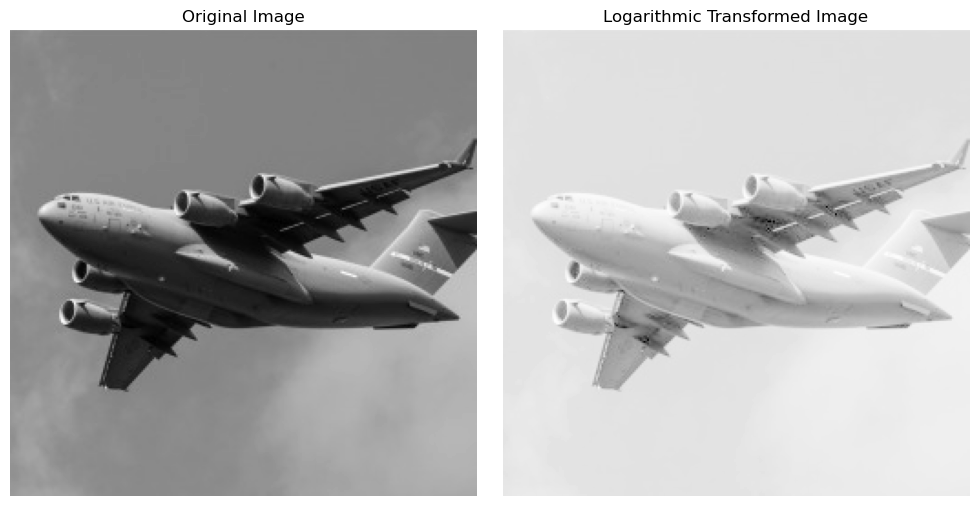

In [36]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image using OpenCV
image = cv2.imread('sim_data-master/images/plane_256x256.jpg', cv2.IMREAD_GRAYSCALE)

# Apply a logarithmic transform
log_transformed = np.log1p(image)  # Adding 1 to prevent log(0)

# Normalize the transformed image to the range [0, 255]
log_transformed = (log_transformed - np.min(log_transformed)) / (np.max(log_transformed) - np.min(log_transformed)) * 255

# Convert the data type back to uint8
log_transformed = log_transformed.astype(np.uint8)

# Display the original and transformed images using matplotlib
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(log_transformed, cmap='gray')
plt.title('Logarithmic Transformed Image')
plt.axis('off')

plt.tight_layout()
plt.show()

Histograma para cada canal de color RGB

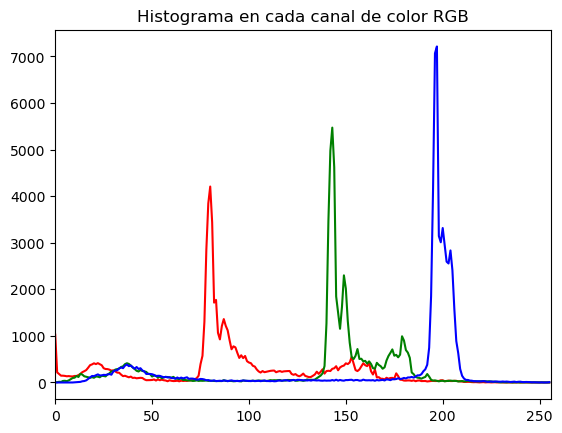

In [34]:
# Calculate the histogram for each color channel

# Load libraries
import cv2
import numpy as np
from matplotlib import pyplot as plt
# Load image
image_bgr = cv2.imread("sim_data-master/images/plane_256x256.jpg", cv2.IMREAD_COLOR)
# Convert to RGB
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

colors = ("r","g","b")
# For each channel: calculate histogram, make plot
for i, channel in enumerate(colors):
     histogram = cv2.calcHist([image_rgb], # Image
     [i], # Index of channel
     None, # No mask
     [256], # Histogram size
     [0,256]) # Range
     plt.plot(histogram, color = channel)
     plt.xlim([0,256])
# Show plot
plt.title('Histograma en cada canal de color RGB')
plt.show()

Histograma escala de grises

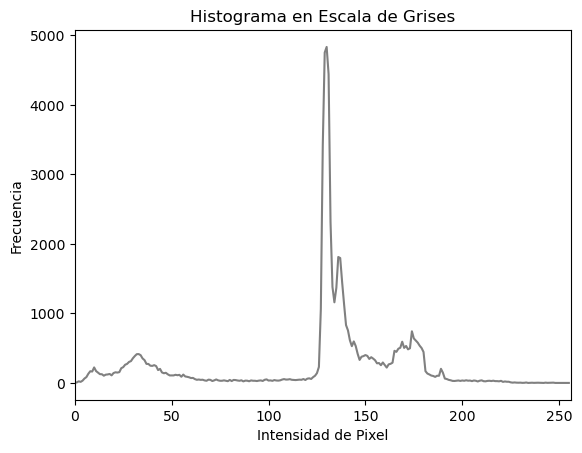

In [33]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load image
image = cv2.imread("sim_data-master/images/plane_256x256.jpg", cv2.IMREAD_GRAYSCALE)

# Calculate histogram for grayscale image
histogram = cv2.calcHist([image], [0], None, [256], [0, 256])

# Plot histogram
plt.plot(histogram, color='gray')
plt.title('Histograma en Escala de Grises')
plt.xlabel('Intensidad de Pixel')
plt.ylabel('Frecuencia')
plt.xlim([0, 256])
plt.show()

**Histogram Equalization:**
Enhances image contrast by redistributing pixel values in the histogram.

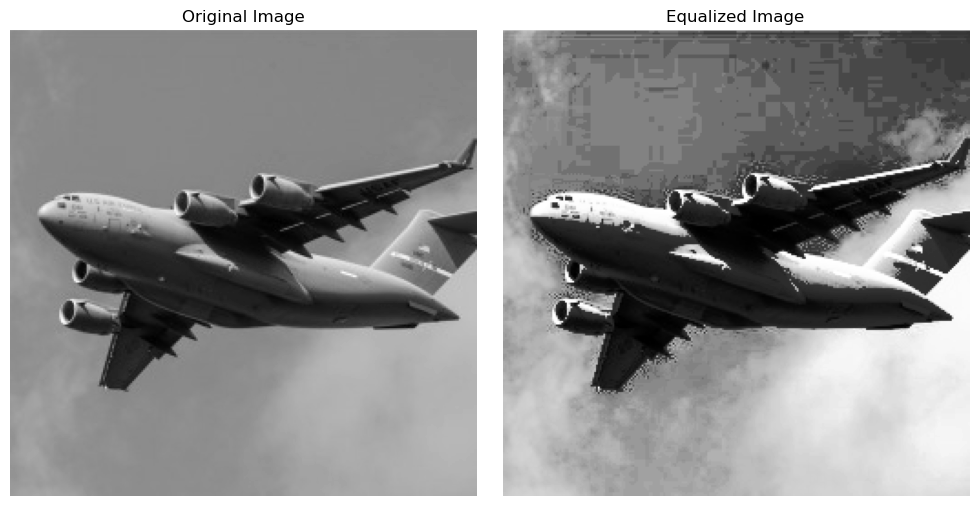

In [31]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color

# Load image
image_bgr = cv2.imread("sim_data-master/images/plane_256x256.jpg", cv2.IMREAD_COLOR)
# Convert to RGB
image = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

if len(image.shape) > 2:
    image = color.rgb2gray(image)

equalized_image = cv2.equalizeHist(np.uint8(image * 255))
    
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(equalized_image, cmap='gray')
plt.title('Equalized Image')
plt.axis('off')

plt.tight_layout()
plt.show()

Otro ejemplo de ecualización de histograma

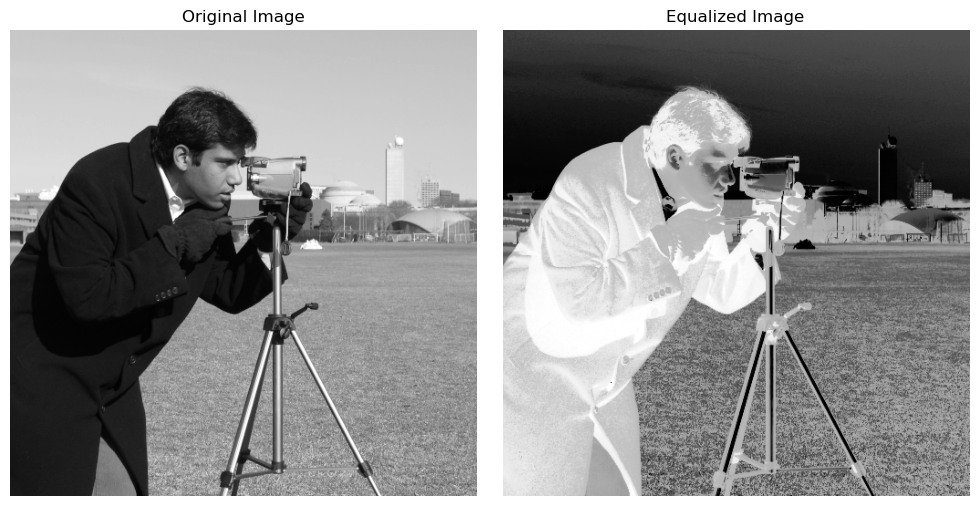

In [35]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color

image = data.camera()  # You can replace this with your own image

if len(image.shape) > 2:
    image = color.rgb2gray(image)

equalized_image = cv2.equalizeHist(np.uint8(image * 255))

    
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(equalized_image, cmap='gray')
plt.title('Equalized Image')
plt.axis('off')

plt.tight_layout()
plt.show()

**FILTROS**

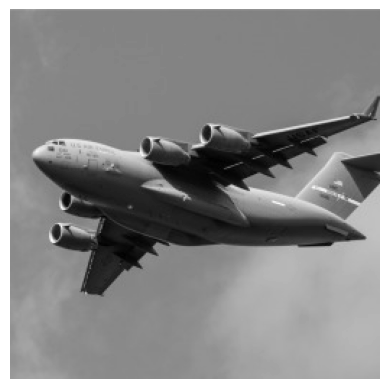

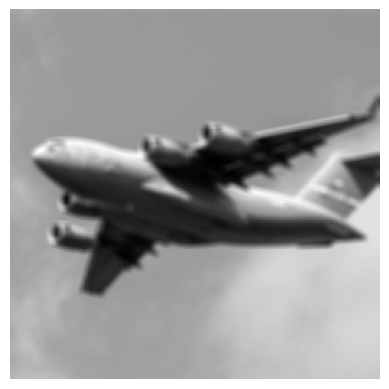

In [1]:
# Blurring Images

#To blur an image, each pixel is transformed to be the average value of its neighbors.
#This neighbor and the operation performed are mathematically represented as a kernel
#The size of this kernel determines the amount of blurring, with larger kernels producing smoother images. 
#Here we blur an image by averaging the values of a 5 × 5 kernel around each pixel:

# Load libraries
import cv2
import numpy as np
from matplotlib import pyplot as plt
# Load image as grayscale
image = cv2.imread("sim_data-master/images/plane_256x256.jpg", cv2.IMREAD_GRAYSCALE)
# Blur image
image_blurry = cv2.blur(image, (5,5))
# Show image
plt.imshow(image, cmap="gray"), plt.axis("off")
plt.show()
plt.imshow(image_blurry, cmap="gray"), plt.axis("off")
plt.show()

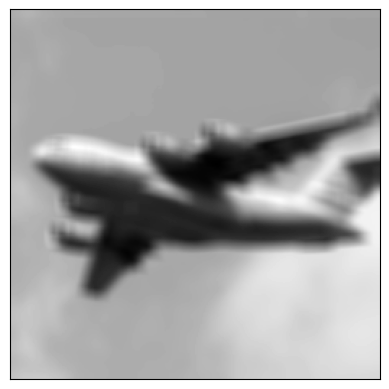

In [3]:
#To highlight the effect of kernel size, here is the same blurring with a 100 × 100 kernel:
# Blur image
image_very_blurry = cv2.blur(image, (10,10))
# Show image
plt.imshow(image_very_blurry, cmap="gray"), plt.xticks([]), plt.yticks([])
plt.show()

In [4]:
#Kernels are widely used in image processing to do everything from sharpening to
#edge detection. The blurring kernel we used looks like this:

# Create kernel
kernel = np.ones((5,5)) / 25.0
# Show kernel
kernel

array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]])

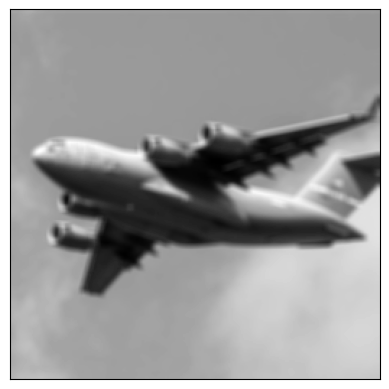

In [5]:
#The center element in the kernel is the pixel being examined, while the remaining ele‐
#ments are its neighbors. Since all elements have the same value (normalized to add up
#to 1), each has an equal say in the resulting value of the pixel of interest. 

#We can manually apply a kernel to an image using filter2D to produce a similar blurring effect:

# Apply kernel
image_kernel = cv2.filter2D(image, -1, kernel)

# Syntax: filter2D (src, dst, ddepth, kernel)

# Parameters:  
# Src – The source image to apply the filter on.
# Dst – Name of the output image after applying the filter
# Ddepth – Depth of the output image [ -1 will give the output image depth as same as the input image]
# Kernel – The 2d matrix we want the image to convolve with.

# Show image
plt.imshow(image_kernel, cmap="gray"), plt.xticks([]), plt.yticks([])
plt.show()

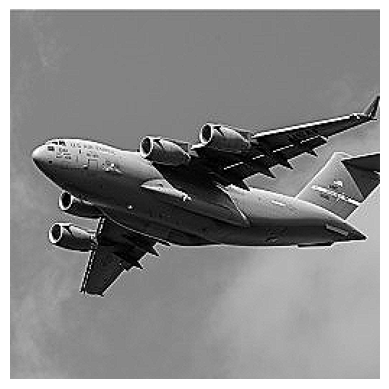

In [6]:
#Sharpening Images
 # Load libraries
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load image as grayscale
image = cv2.imread("sim_data-master/images/plane_256x256.jpg", cv2.IMREAD_GRAYSCALE)
# Create kernel
kernel = np.array([[0, -1, 0],
                   [-1, 5,-1],
                   [0, -1, 0]])
# Sharpen image
image_sharp = cv2.filter2D(image, -1, kernel)
# Show image
plt.imshow(image_sharp, cmap="gray"), plt.axis("off")
plt.show()

Algunos ejemplos de filtros se muestran a continuación.

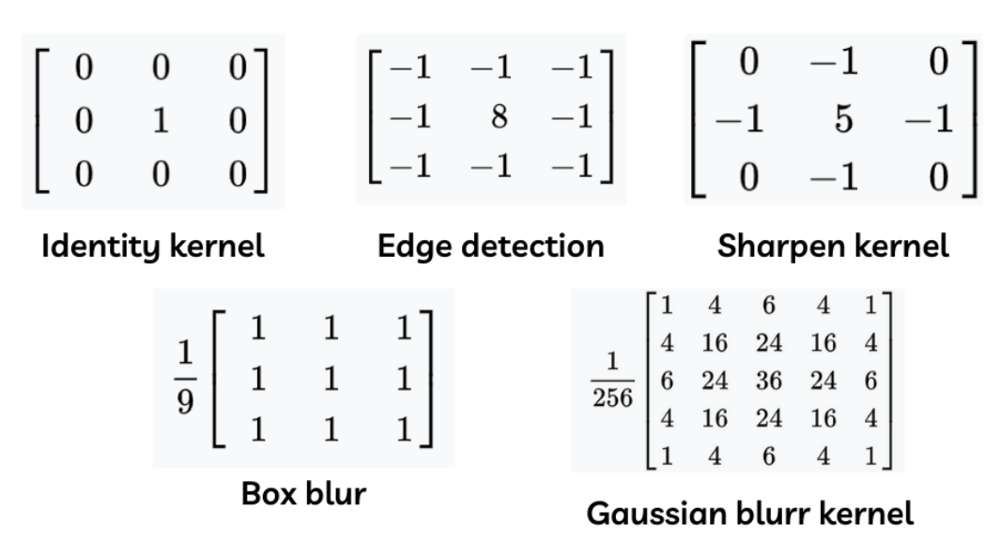


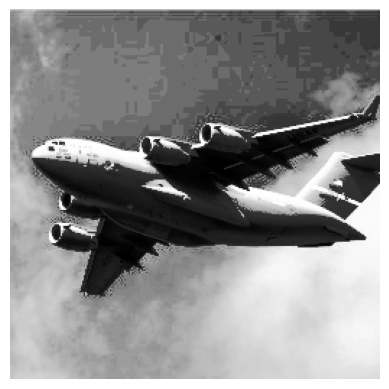

In [7]:
#  Enhancing Contrast - We want to increase the contrast between pixels in an image.

# Histogram equalization is a tool for image processing that can make objects and
# shapes stand out. When we have a grayscale image, we can apply OpenCV’s equali
# zeHist directly on the image:

# Load libraries
import cv2
import numpy as np
from matplotlib import pyplot as plt
# Load image
image = cv2.imread("sim_data-master/images/plane_256x256.jpg", cv2.IMREAD_GRAYSCALE)
# Enhance image
image_enhanced = cv2.equalizeHist(image) # it transforms the image so that it uses a wider range of pixel intensities
# Show image
plt.imshow(image_enhanced, cmap="gray"), plt.axis("off")
plt.show()

However, when we have a color image, we first need to convert the image to the YUV color format. The Y is the luma, or brightness, and U and V denote the color. 


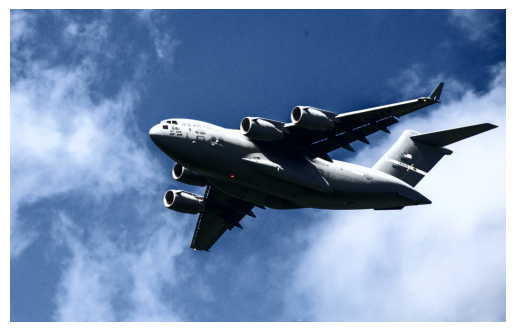

In [8]:
# After the conversion, we can apply equalizeHist to the image and then convert it back to
# BGR or RGB:

# Load image
image_bgr = cv2.imread("sim_data-master/images/plane.jpg")
# Convert to YUV
image_yuv = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2YUV)
# Apply histogram equalization
image_yuv[:, :, 0] = cv2.equalizeHist(image_yuv[:, :, 0])
# Convert to RGB
image_rgb = cv2.cvtColor(image_yuv, cv2.COLOR_YUV2RGB)
# Show image
plt.imshow(image_rgb), plt.axis("off")
plt.show()

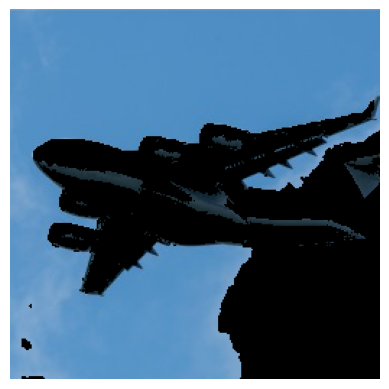

In [9]:
#  Isolating Colors - Define a range of colors and then apply a mask to the image

# First we convert an image into HSV (hue, saturation, and value). 
# Second, we define a range of values we want to isolate, which is probably the most difficult and time-consuming part. 
# Third, we create a mask for the image (we will only keep the white areas):

# Load libraries
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load image
image_bgr = cv2.imread('sim_data-master/images/plane_256x256.jpg')

# Convert BGR to HSV
image_hsv = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2HSV)

# Define range of blue values in HSV
lower_blue = np.array([50,100,50])
upper_blue = np.array([130,255,255])

# Create mask
mask = cv2.inRange(image_hsv, lower_blue, upper_blue)

# Mask image
image_bgr_masked = cv2.bitwise_and(image_bgr, image_bgr, mask=mask)

# Convert BGR to RGB
image_rgb = cv2.cvtColor(image_bgr_masked, cv2.COLOR_BGR2RGB)

# Show image
plt.imshow(image_rgb), plt.axis("off")
plt.show()

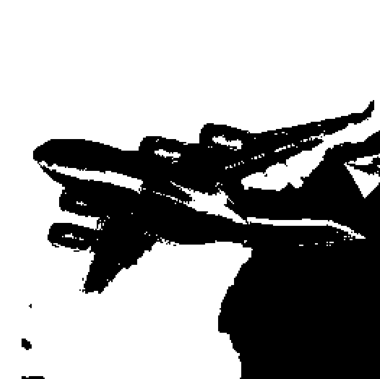

In [10]:
#Finally, we apply the mask to the image using bitwise_and and convert to our desired output format.

# Show image
plt.imshow(mask, cmap='gray'), plt.axis("off")
plt.show()

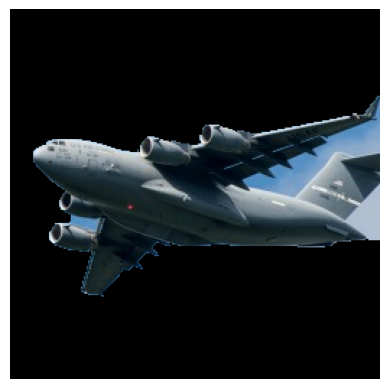

In [19]:
# Removing Backgrounds - You want to isolate the foreground of an image.

# Mark a rectangle around the desired foreground, then run the GrabCut algorithm

# Load library
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load image and convert to RGB
image_bgr = cv2.imread('sim_data-master/images/plane_256x256.jpg')
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Rectangle values: start x, start y, width, height
rectangle = (0, 56, 256, 150)

# Create initial mask
mask = np.zeros(image_rgb.shape[:2], np.uint8)

# Create temporary arrays used by grabCut
bgdModel = np.zeros((1, 65), np.float64)
fgdModel = np.zeros((1, 65), np.float64)

# Run grabCut
cv2.grabCut(image_rgb, # Our image
 mask, # The Mask
 rectangle, # Our rectangle
 bgdModel, # Temporary array for background
 fgdModel, # Temporary array for background
 5, # Number of iterations
 cv2.GC_INIT_WITH_RECT) # Initiative using our rectangle

# Create mask where sure and likely backgrounds set to 0, otherwise 1
mask_2 = np.where((mask==2) | (mask==0), 0, 1).astype('uint8')

# Multiply image with new mask to subtract background
image_rgb_nobg = image_rgb * mask_2[:, :, np.newaxis]

# Show image
plt.imshow(image_rgb_nobg), plt.axis("off")
plt.show()

The first thing we notice is that even though GrabCut did a pretty good job, there are
still areas of background left in the image. We could go back and manually mark
those areas as background, but in the real world we have thousands of images and
manually fixing them individually is not feasible. Therefore, we would do well by
simply accepting that the image data will still contain some background noise.

In our solution, we start out by marking a rectangle around the area that contains the
foreground. GrabCut assumes everything outside this rectangle to be background
and uses that information to figure out what is likely background inside the square
(to learn how the algorithm does this, check out the external resources at the end of
this solution). Then a mask is created that denotes the different definitely/likely back‐
ground/foreground regions:

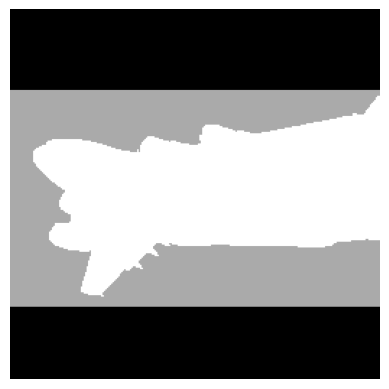

In [20]:
# Show mask
plt.imshow(mask, cmap='gray'), plt.axis("off")
plt.show()

The black region is the area outside our rectangle that is assumed to be definitely
background. The gray area is what GrabCut considered likely background, while the
white area is likely foreground

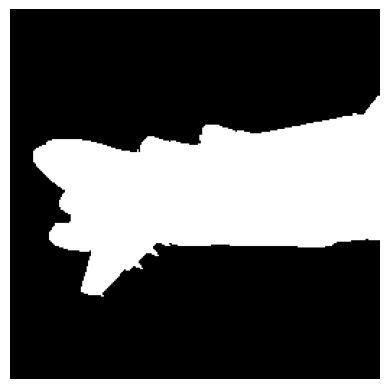

In [21]:
# Show mask
plt.imshow(mask_2, cmap='gray'), plt.axis("off")
plt.show()

This mask is then used to create a second mask that merges the black and gray
regions. The second mask is then applied to the image so that only the foreground remains

In [43]:
!pip install PyWavelets

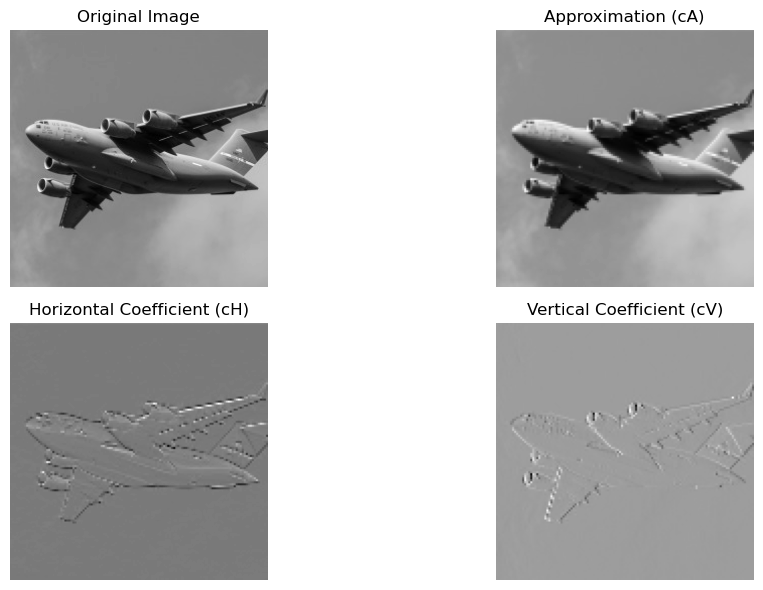

In [44]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pywt

# Load the image using OpenCV
image = cv2.imread('sim_data-master/images/plane_256x256.jpg', cv2.IMREAD_GRAYSCALE)

# Perform a 2D wavelet transform (e.g., using the Haar wavelet)
wavelet = 'haar'
coeffs = pywt.dwt2(image, wavelet)

# Get the approximation, horizontal, vertical, and diagonal coefficients
cA, (cH, cV, cD) = coeffs

# Display the original image and the wavelet coefficients using matplotlib
plt.figure(figsize=(12, 6))

plt.subplot(2, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(cA, cmap='gray')
plt.title('Approximation (cA)')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(cH, cmap='gray')
plt.title('Horizontal Coefficient (cH)')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(cV, cmap='gray')
plt.title('Vertical Coefficient (cV)')
plt.axis('off')

plt.tight_layout()
plt.show()

**Blur Filters:**

**Gaussian Blur:** Reduces noise and smooths an image by applying a Gaussian-weighted average to the pixels.

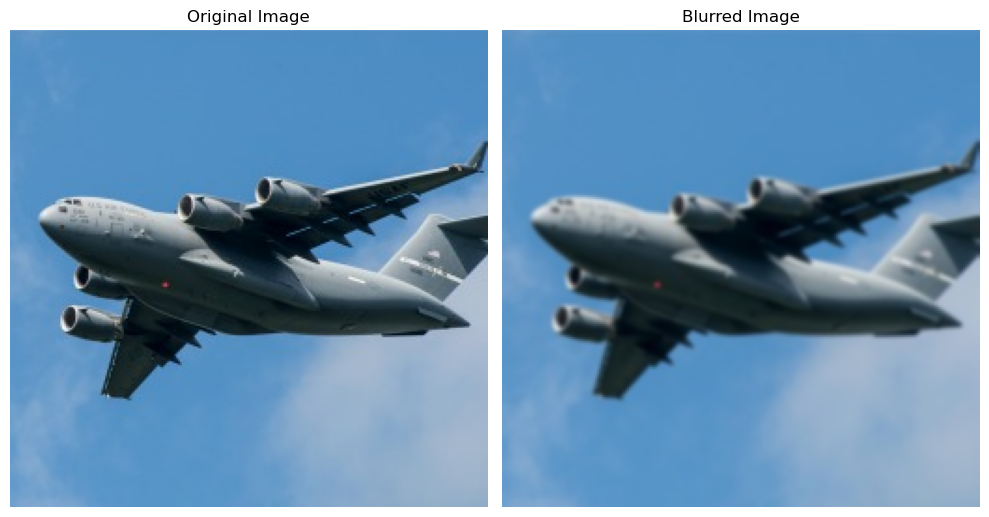

In [45]:
import cv2

# Load the image
image = cv2.imread('sim_data-master/images/plane_256x256.jpg')

kernel_size = (5, 5)  # Adjust the kernel size as needed
blurred_image = cv2.GaussianBlur(image, kernel_size, 0)

plt.figure(figsize=(10, 6))

# Original Image
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

# Blurred Image
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(blurred_image, cv2.COLOR_BGR2RGB))
plt.title('Blurred Image')
plt.axis('off')

plt.tight_layout()
plt.show()

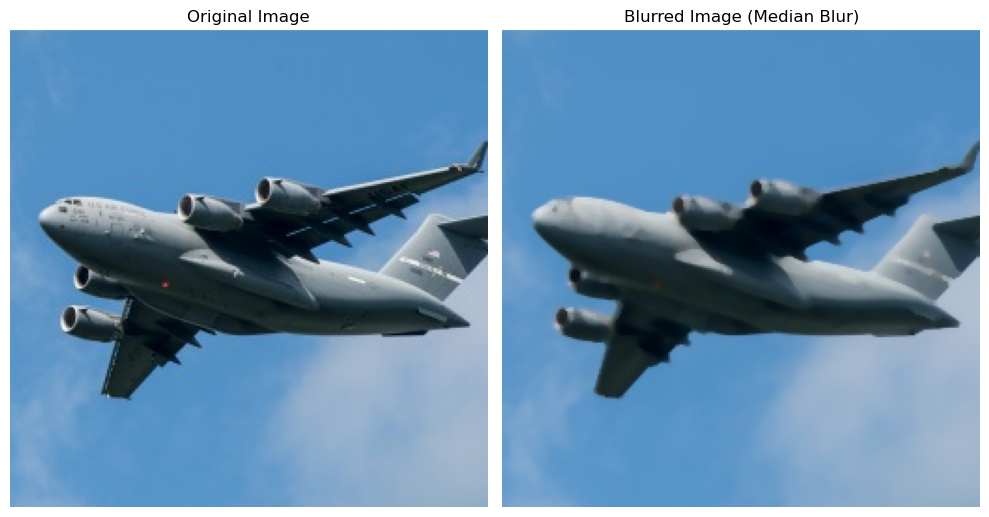

In [46]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Load and read the image
image = cv2.imread('sim_data-master/images/plane_256x256.jpg')

# Apply Median Blur to the image
kernel_size = 5  # Adjust the kernel size as needed
blurred_image = cv2.medianBlur(image, kernel_size)

# Display the original and blurred images using imshow
plt.figure(figsize=(10, 6))

# Original Image
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

# Blurred Image
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(blurred_image, cv2.COLOR_BGR2RGB))
plt.title('Blurred Image (Median Blur)')
plt.axis('off')

plt.tight_layout()
plt.show()

**Sharpening Filters:**

**Laplacian Filter:** Enhances edges and details by highlighting abrupt intensity changes.

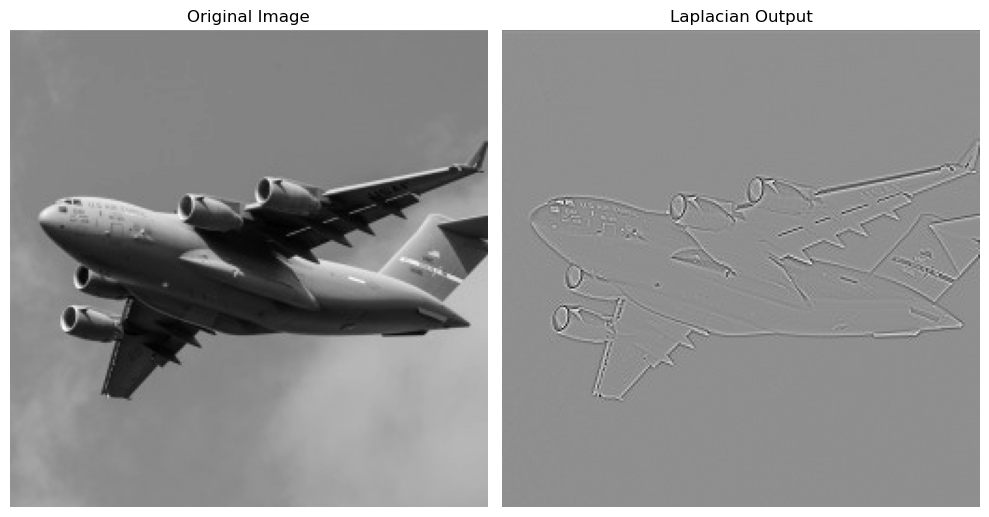

In [49]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Load and read the image
image_path = 'sim_data-master/images/plane_256x256.jpg'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Apply Laplacian filter to the image
laplacian = cv2.Laplacian(image, cv2.CV_64F)

# Display the original image and the Laplacian output using imshow
plt.figure(figsize=(10, 6))

# Original Image
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Laplacian Output
plt.subplot(1, 2, 2)
plt.imshow(laplacian, cmap='gray')
plt.title('Laplacian Output')
plt.axis('off')

plt.tight_layout()
plt.show()

**Unsharp Masking:** Increases image sharpness by subtracting a blurred version of the image from the original.

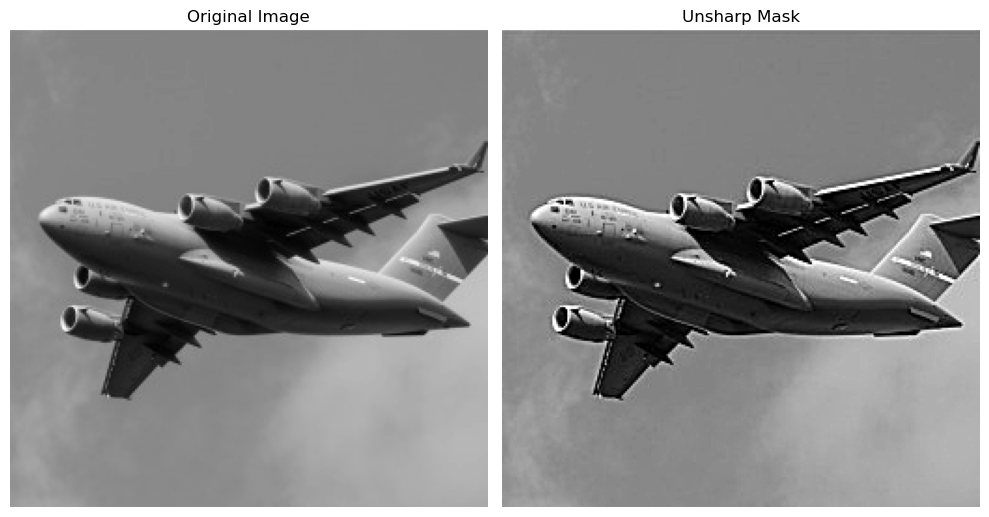

In [50]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Load and read the image
image_path = 'sim_data-master/images/plane_256x256.jpg'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Apply Gaussian blur to the image
blurred = cv2.GaussianBlur(image, (5, 5), 2.0)  # Adjust kernel size and sigma as needed

# Calculate the unsharp mask
unsharp_mask = cv2.addWeighted(image, 2.5, blurred, -1.5, 0)

# Display the original image and the unsharp mask using imshow
plt.figure(figsize=(10, 6))

# Original Image
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Unsharp Mask
plt.subplot(1, 2, 2)
plt.imshow(unsharp_mask, cmap='gray')
plt.title('Unsharp Mask')
plt.axis('off')

plt.tight_layout()
plt.show()

**Noise Reduction Filters:**

**Bilateral Filter:** Smooths images while preserving edges by considering both spatial and intensity differences. The bilateral filter is a non-linear edge-preserving filter used for smoothing while preserving the edges in an image.

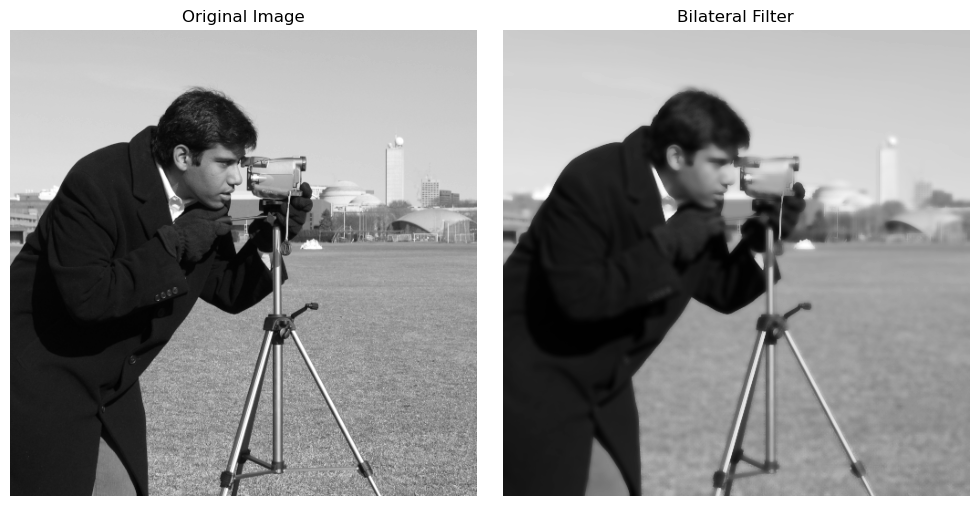

In [54]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color

image = data.camera()  # You can replace this with your own image

if len(image.shape) > 2:
    image = color.rgb2gray(image)
    
filtered_image = cv2.bilateralFilter(image, d=9, sigmaColor=75, sigmaSpace=75)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(filtered_image, cmap='gray')
plt.title('Bilateral Filter')
plt.axis('off')

plt.tight_layout()
plt.show()

**Non-local Means Filter:** Removes noise by averaging similar patches from the entire image.


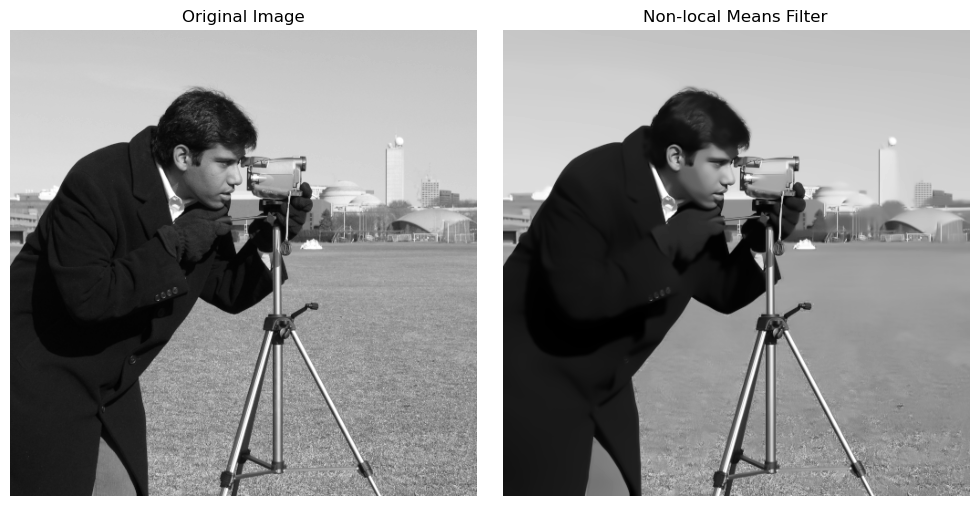

In [55]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color

image = data.camera()  # You can replace this with your own image

if len(image.shape) > 2:
    image = color.rgb2gray(image)
    
filtered_image = cv2.fastNlMeansDenoising(image, None, h=10, searchWindowSize=21)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(filtered_image, cmap='gray')
plt.title('Non-local Means Filter')
plt.axis('off')

plt.tight_layout()
plt.show()

**Morphological Filters:**

**Erosion:** Shrinks object boundaries in a binary image.

In [56]:
!pip install numpy matplotlib opencv-python scikit-image

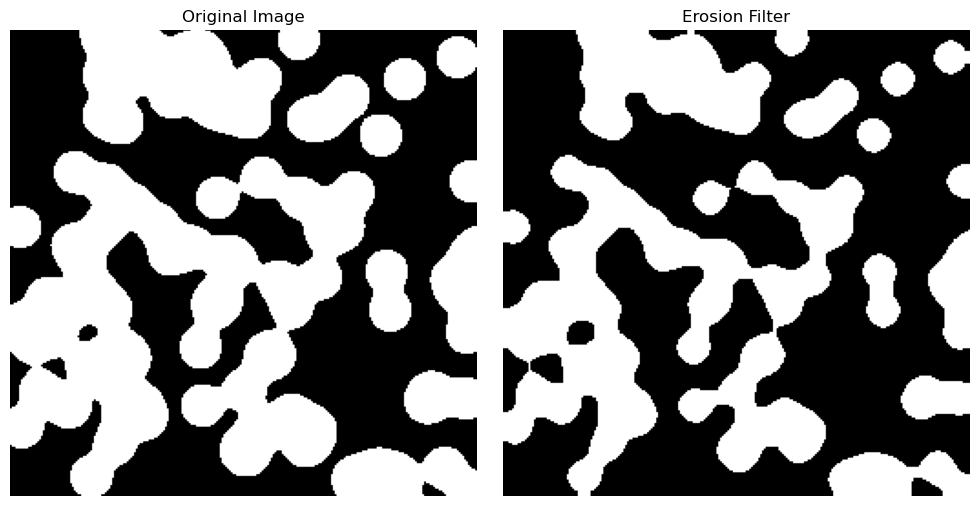

In [57]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color

# Load an example binary image
image = data.binary_blobs(length=256, n_dim=2, blob_size_fraction=0.1)

# Convert the image to grayscale if needed
if len(image.shape) > 2:
    image = color.rgb2gray(image)

# Convert the image to a suitable format for OpenCV
image_cv = np.uint8(image * 255)  # Convert to 8-bit grayscale

# Define the kernel (structuring element) for erosion
kernel = np.ones((5, 5), np.uint8)  # You can adjust the kernel size

# Apply the erosion filter to the image
eroded_image = cv2.erode(image_cv, kernel, iterations=1)

# Display the original image and the eroded image using imshow
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(eroded_image, cmap='gray')
plt.title('Erosion Filter')
plt.axis('off')

plt.tight_layout()
plt.show()

**Dilation:** Expands object boundaries in a binary image.

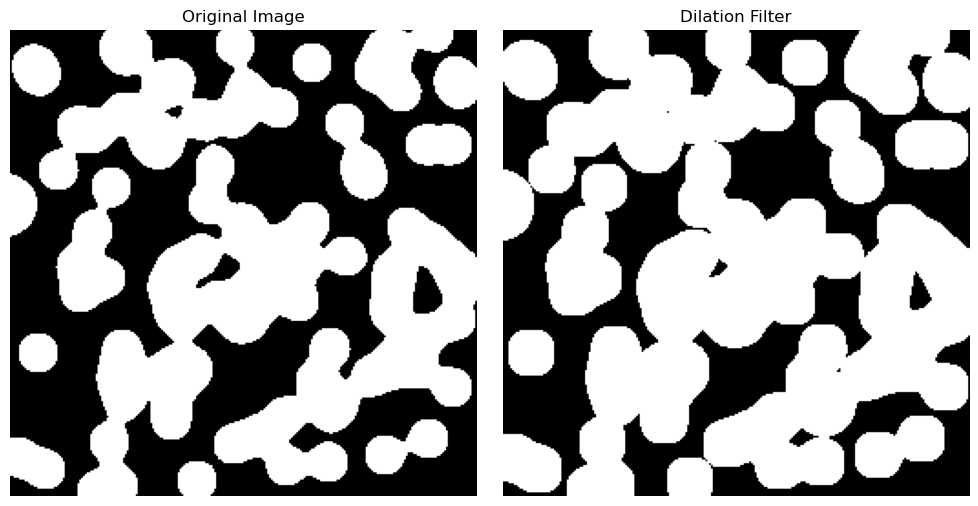

In [58]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color

# Load an example binary image
image = data.binary_blobs(length=256, n_dim=2, blob_size_fraction=0.1)

# Convert the image to grayscale if needed
if len(image.shape) > 2:
    image = color.rgb2gray(image)

# Convert the image to a suitable format for OpenCV
image_cv = np.uint8(image * 255)  # Convert to 8-bit grayscale

# Define the kernel (structuring element) for dilation
kernel = np.ones((5, 5), np.uint8)  # You can adjust the kernel size

# Apply the dilation filter to the image
dilated_image = cv2.dilate(image_cv, kernel, iterations=1)

# Display the original image and the dilated image using imshow
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(dilated_image, cmap='gray')
plt.title('Dilation Filter')
plt.axis('off')

plt.tight_layout()
plt.show()

**Opening:** Erosion followed by dilation; useful for noise reduction.

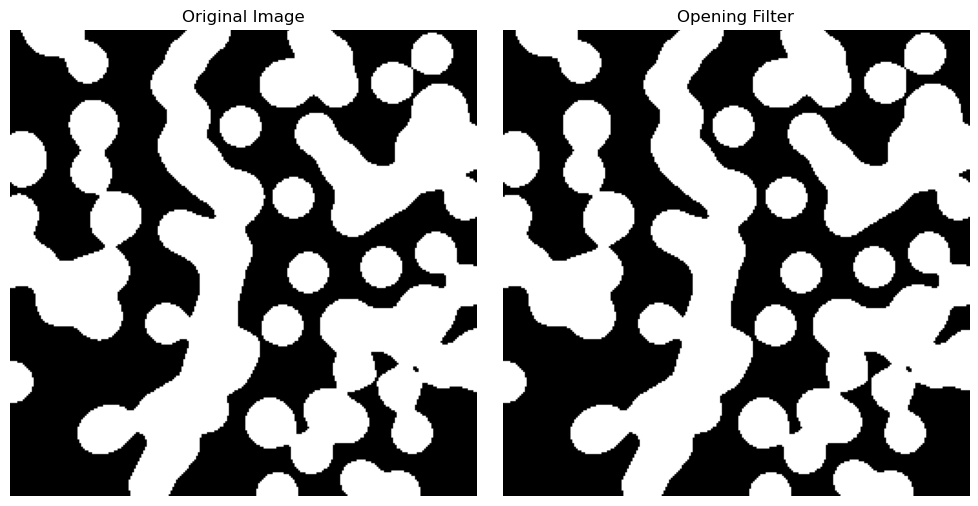

In [59]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color

# Load an example binary image
image = data.binary_blobs(length=256, n_dim=2, blob_size_fraction=0.1)

# Convert the image to grayscale if needed
if len(image.shape) > 2:
    image = color.rgb2gray(image)

# Convert the image to a suitable format for OpenCV
image_cv = np.uint8(image * 255)  # Convert to 8-bit grayscale

# Define the kernel (structuring element) for opening
kernel = np.ones((5, 5), np.uint8)  # You can adjust the kernel size

# Apply the opening filter to the image
opened_image = cv2.morphologyEx(image_cv, cv2.MORPH_OPEN, kernel)

# Display the original image and the opened image using imshow
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(opened_image, cmap='gray')
plt.title('Opening Filter')
plt.axis('off')

plt.tight_layout()
plt.show()

**Closing:** Dilation followed by erosion; helps to close small gaps between objects.

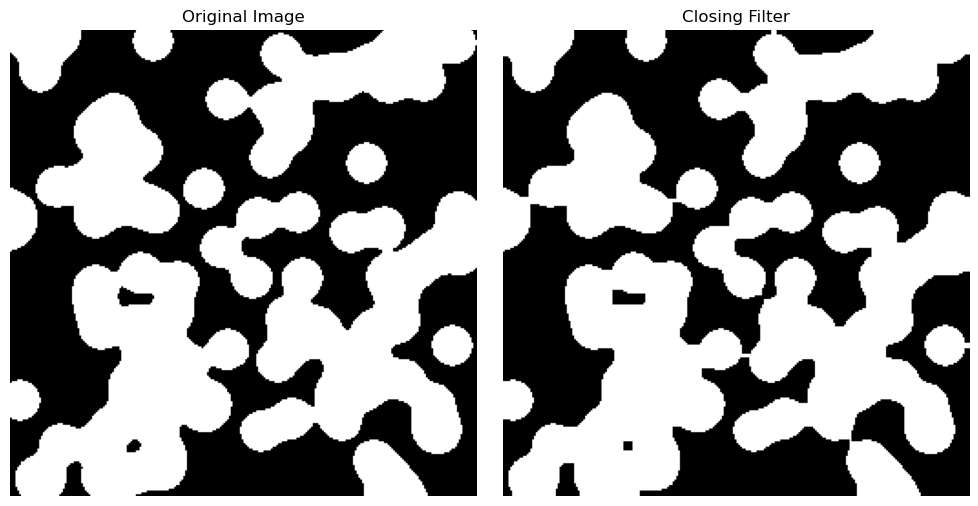

In [60]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color

# Load an example binary image
image = data.binary_blobs(length=256, n_dim=2, blob_size_fraction=0.1)

# Convert the image to grayscale if needed
if len(image.shape) > 2:
    image = color.rgb2gray(image)

# Convert the image to a suitable format for OpenCV
image_cv = np.uint8(image * 255)  # Convert to 8-bit grayscale

# Define the kernel (structuring element) for closing
kernel = np.ones((5, 5), np.uint8)  # You can adjust the kernel size

# Apply the closing filter to the image
closed_image = cv2.morphologyEx(image_cv, cv2.MORPH_CLOSE, kernel)

# Display the original image and the closed image using imshow
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(closed_image, cmap='gray')
plt.title('Closing Filter')
plt.axis('off')

plt.tight_layout()
plt.show()

**Color Filters:**

Color filters in image processing are operations that modify the color channels of an image to achieve certain effects.

**Grayscale Filter:**
This filter converts a color image into grayscale by averaging the color channels.

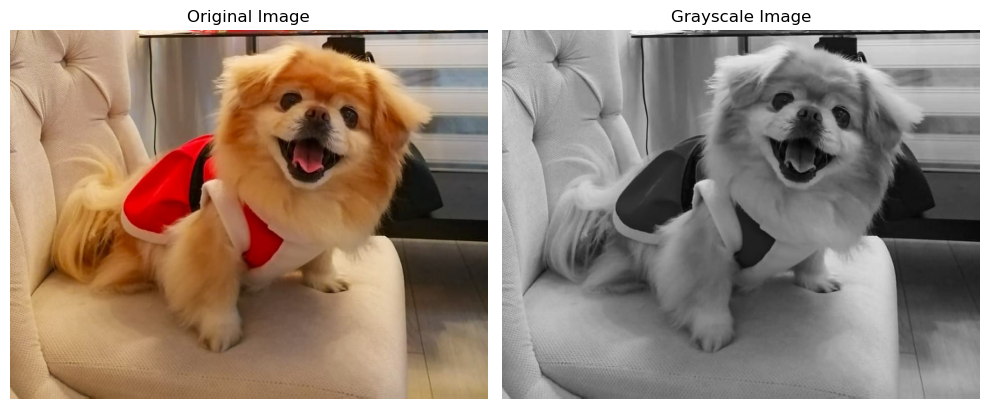

In [61]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color

# Load an example image
image = plt.imread("sim_data-master/images/dog.jpeg")  # Replace with your image path

# Convert the image to grayscale
gray_image = color.rgb2gray(image)

# Display the original and grayscale images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(gray_image, cmap='gray')
plt.title('Grayscale Image')
plt.axis('off')

plt.tight_layout()
plt.show()

**Color Inversion Filter:**
This filter inverts the color of each pixel.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


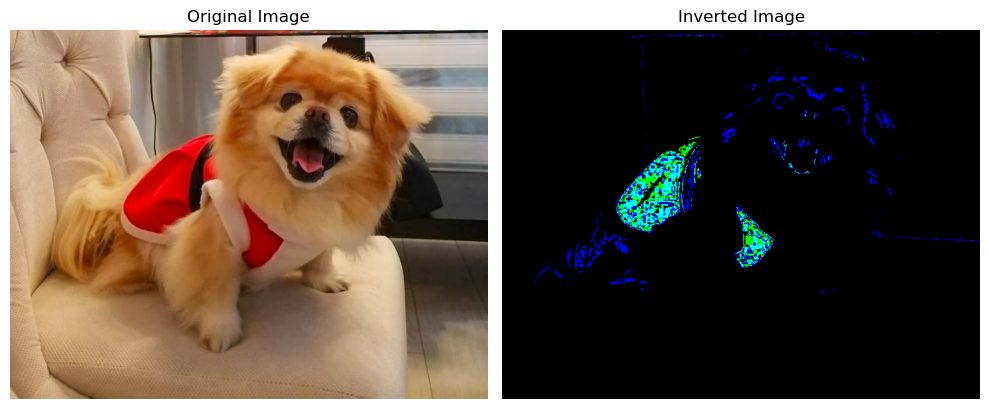

In [62]:
def apply_color_inversion(image):
    inverted_image = 1.0 - image
    return inverted_image

# Load an example image
image = plt.imread("sim_data-master/images/dog.jpeg")  # Replace with your image path

# Apply color inversion filter
inverted_image = apply_color_inversion(image)

# Display the original and inverted images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(inverted_image)
plt.title('Inverted Image')
plt.axis('off')

plt.tight_layout()
plt.show()

**Color thresholding** is a technique used to segment an image based on color. It involves creating binary masks where pixels that meet certain color criteria are set to one value (e.g., white) and pixels that don't meet the criteria are set to another value (e.g., black).

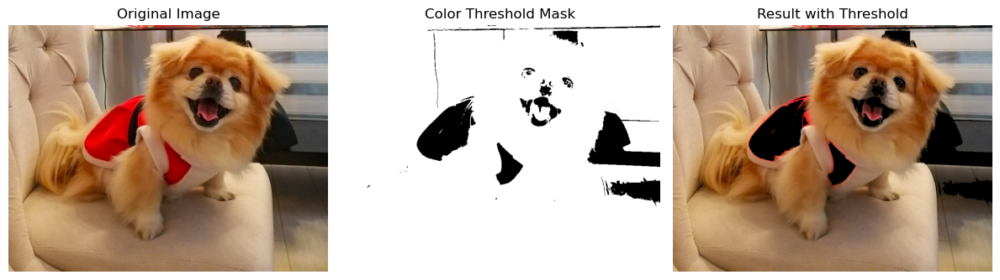

In [63]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load an example image
image = cv2.imread("sim_data-master/images/dog.jpeg")  # Replace with your image path
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB

# Define the color range for thresholding (lower and upper bounds)
lower_bound = np.array([50, 20, 0], dtype=np.uint8)
upper_bound = np.array([255, 255, 255], dtype=np.uint8)

# Create a binary mask using inRange function
mask = cv2.inRange(image, lower_bound, upper_bound)

# Apply the mask to the original image
result = cv2.bitwise_and(image, image, mask=mask)

# Display the original image, mask, and result
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.imshow(image)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(mask, cmap='gray')
plt.title('Color Threshold Mask')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(result)
plt.title('Result with Threshold')
plt.axis('off')

plt.tight_layout()
plt.show()

**Channel Separation:** Separates channels in color images to manipulate individual color components.

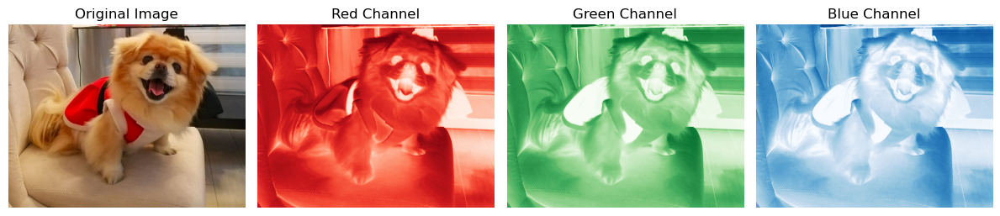

In [64]:
import numpy as np
import matplotlib.pyplot as plt

# Load an example image
image = cv2.imread("sim_data-master/images/dog.jpeg")  # Replace with your image path
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB

# Separate color channels
red_channel = image[:, :, 0]
green_channel = image[:, :, 1]
blue_channel = image[:, :, 2]

# Display the original image and separated color channels
plt.figure(figsize=(12, 4))

plt.subplot(1, 4, 1)
plt.imshow(image)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(red_channel, cmap='Reds')
plt.title('Red Channel')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(green_channel, cmap='Greens')
plt.title('Green Channel')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(blue_channel, cmap='Blues')
plt.title('Blue Channel')
plt.axis('off')

plt.tight_layout()
plt.show()

**Filtering an image in the HSL** (Hue, Saturation, Lightness) color space involves manipulating the individual H, S, and L channels to achieve various effects. 

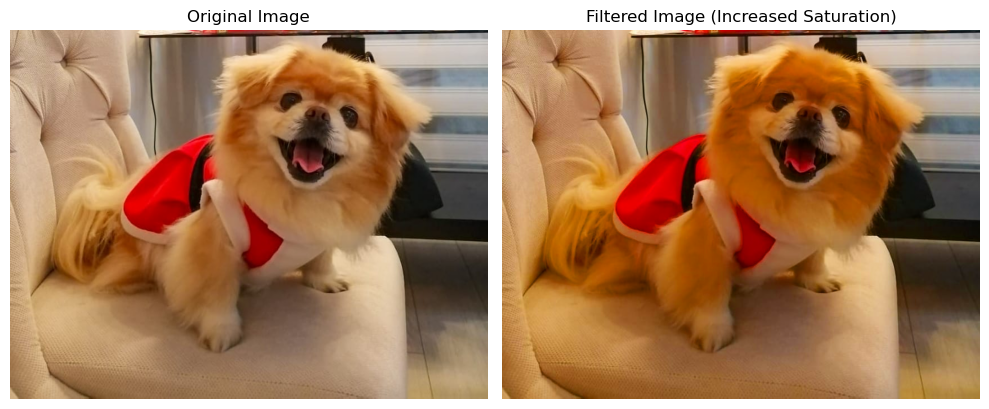

In [65]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import color

# Load an example image
image = cv2.imread("sim_data-master/images/dog.jpeg")  # Replace with your image path
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB

# Convert the image to the HSL color space
image_hsl = color.rgb2hsv(image_rgb)  # HSL is the same as HSV

# Apply the saturation filter (increase saturation)
saturation_factor = 1.5  # Adjust the saturation factor as desired
image_hsl[:, :, 1] *= saturation_factor
image_hsl[:, :, 1] = np.clip(image_hsl[:, :, 1], 0, 1)  # Ensure values stay within [0, 1]

# Convert the modified HSL image back to RGB
filtered_image_rgb = color.hsv2rgb(image_hsl)

# Display the original image and the filtered image
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image_rgb)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(filtered_image_rgb)
plt.title('Filtered Image (Increased Saturation)')
plt.axis('off')

plt.tight_layout()
plt.show()

**Filtering an image in the HSV** (Hue, Saturation, Value) color space involves manipulating the individual H, S, and V channels to achieve various effects. 

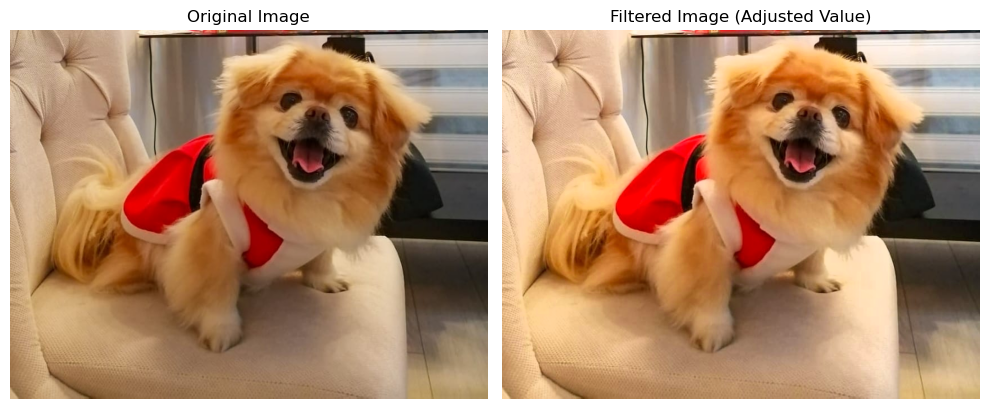

In [66]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load an example image
image = cv2.imread("sim_data-master/images/dog.jpeg")  # Replace with your image path
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB

# Convert the image to the HSV color space
image_hsv = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2HSV)

# Apply the value filter (adjust brightness/contrast)
value_factor = 1.2  # Adjust the value factor as desired
image_hsv[:, :, 2] = np.clip(image_hsv[:, :, 2] * value_factor, 0, 255)

# Convert the modified HSV image back to RGB
filtered_image_rgb = cv2.cvtColor(image_hsv, cv2.COLOR_HSV2RGB)

# Display the original image and the filtered image
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image_rgb)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(filtered_image_rgb)
plt.title('Filtered Image (Adjusted Value)')
plt.axis('off')

plt.tight_layout()
plt.show()

**Frequency domain filtering** is used to process images by modifying their frequency components using techniques like low-pass, high-pass, or band-pass filters. 

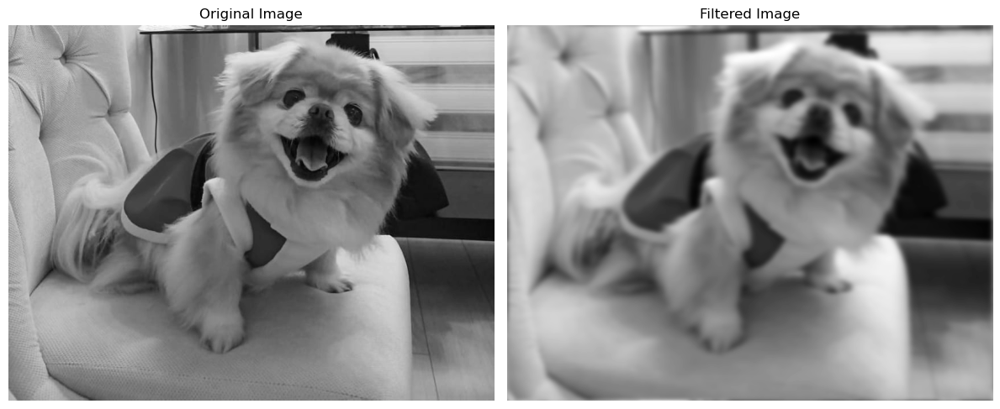

In [129]:
#low-pass frequency filter

import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy import fftpack

# Load an example image
image = cv2.imread("sim_data-master/images/dog.jpeg", cv2.IMREAD_GRAYSCALE)  # Replace with your image path
#image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB

# Convert image to floating-point type
image_float = np.float32(image)

# Perform FFT (Fast Fourier Transform) on the image
fft_image = fftpack.fft2(image_float)

# Shift the zero frequency component to the center
fft_shifted = fftpack.fftshift(fft_image)

# Create a Gaussian low-pass filter
rows, cols = image.shape
center_row, center_col = rows // 2, cols // 2
filter_radius = 30  # Adjust the radius of the filter
low_pass_filter = np.zeros((rows, cols), dtype=np.float32)
for i in range(rows):
    for j in range(cols):
        distance = np.sqrt((i - center_row)**2 + (j - center_col)**2)
        low_pass_filter[i, j] = np.exp(-0.5 * (distance / filter_radius)**2)

# Apply the filter in the frequency domain
filtered_shifted = fft_shifted * low_pass_filter

# Perform inverse FFT to get the filtered image in spatial domain
filtered_image = np.real(fftpack.ifft2(fftpack.ifftshift(filtered_shifted)))
filtered_image = np.clip(filtered_image, 0, 255).astype(np.uint8)

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(filtered_image, cmap='gray')
plt.title('Filtered Image')
plt.axis('off')

plt.tight_layout()
plt.show()

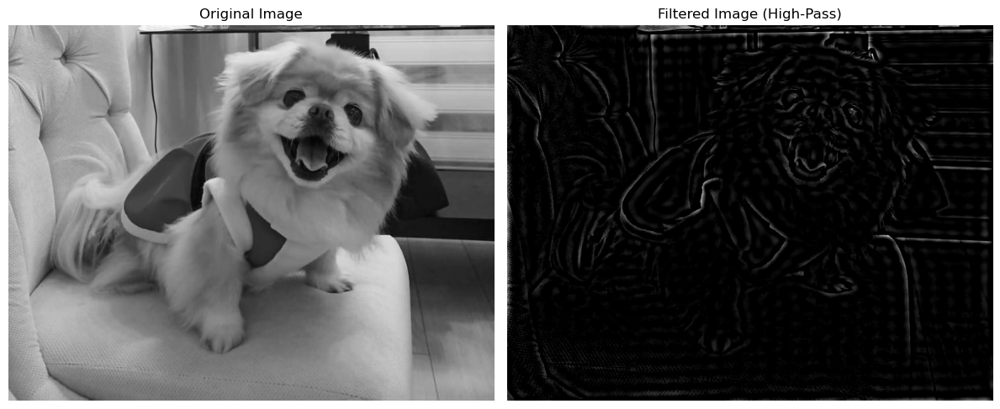

In [130]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy import fftpack

# Load an example image
image = cv2.imread("sim_data-master/images/dog.jpeg", cv2.IMREAD_GRAYSCALE)  # Replace with your image path
#image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB

# Convert image to floating-point type
image_float = np.float32(image)

# Perform FFT (Fast Fourier Transform) on the image
fft_image = fftpack.fft2(image_float)

# Shift the zero frequency component to the center
fft_shifted = fftpack.fftshift(fft_image)

# Create a high-pass filter
rows, cols = image.shape
center_row, center_col = rows // 2, cols // 2
filter_radius = 30  # Adjust the radius of the filter
high_pass_filter = np.ones((rows, cols), dtype=np.float32)
for i in range(rows):
    for j in range(cols):
        distance = np.sqrt((i - center_row)**2 + (j - center_col)**2)
        if distance <= filter_radius:
            high_pass_filter[i, j] = 0

# Apply the filter in the frequency domain
filtered_shifted = fft_shifted * high_pass_filter

# Perform inverse FFT to get the filtered image in spatial domain
filtered_image = np.real(fftpack.ifft2(fftpack.ifftshift(filtered_shifted)))
filtered_image = np.clip(filtered_image, 0, 255).astype(np.uint8)

# Display original and filtered images
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(filtered_image, cmap='gray')
plt.title('Filtered Image (High-Pass)')
plt.axis('off')

plt.tight_layout()
plt.show()

Visualizing the Fourier components of an image involves plotting the magnitude spectrum and phase spectrum of its Fourier Transform.

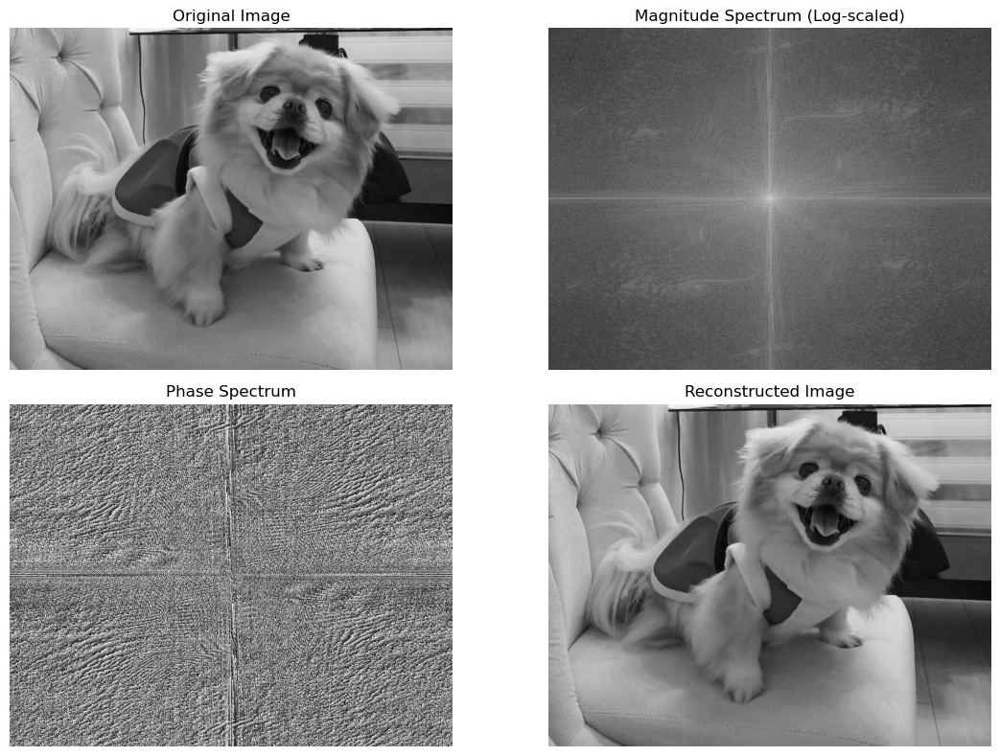

In [132]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy import fftpack

# Load an example image
image = cv2.imread("sim_data-master/images/dog.jpeg", cv2.IMREAD_GRAYSCALE) 

# Convert image to floating-point type
image_float = np.float32(image)

# Perform FFT (Fast Fourier Transform) on the image
fft_image = fftpack.fft2(image_float)

# Shift the zero frequency component to the center
fft_shifted = fftpack.fftshift(fft_image)

# Calculate the magnitude spectrum and phase spectrum
magnitude_spectrum = np.abs(fft_shifted)
phase_spectrum = np.angle(fft_shifted)

# Display the original image and the Fourier components
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(np.log(1 + magnitude_spectrum), cmap='gray')
plt.title('Magnitude Spectrum (Log-scaled)')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(phase_spectrum, cmap='gray')
plt.title('Phase Spectrum')
plt.axis('off')

plt.subplot(2, 2, 4)
reconstructed_image = np.real(fftpack.ifft2(fftpack.ifftshift(fft_shifted)))
plt.imshow(reconstructed_image, cmap='gray')
plt.title('Reconstructed Image')
plt.axis('off')

plt.tight_layout()
plt.show()

**magnitude spectrum threshold filtering**

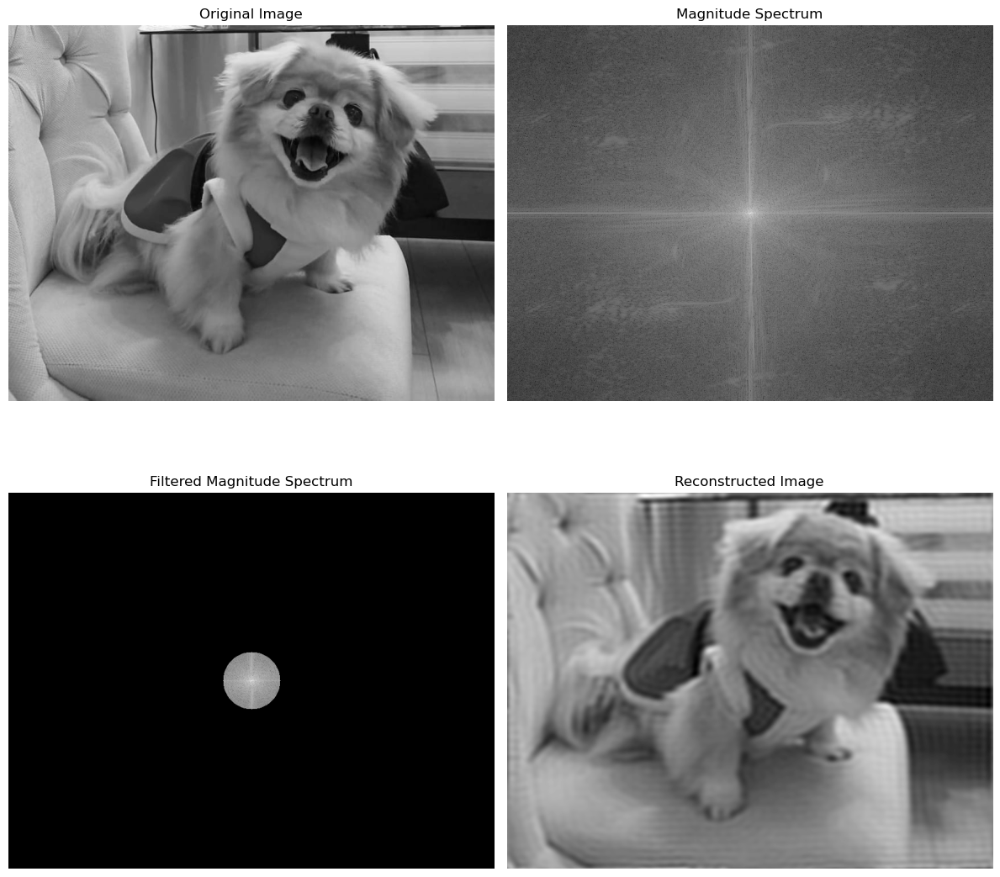

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy import fftpack

# Load an example image
image = cv2.imread("sim_data-master/images/dog.jpeg", cv2.IMREAD_GRAYSCALE) 

# Convert image to floating-point type
image_float = np.float32(image)

# Perform FFT (Fast Fourier Transform) on the image
fft_image = fftpack.fft2(image_float)

# Shift the zero frequency component to the center
fft_shifted = fftpack.fftshift(fft_image)

# Calculate the magnitude spectrum
magnitude_spectrum = np.abs(fft_shifted)

# Define frequency ranges for filtering (e.g., a small circular region)
center_row, center_col = magnitude_spectrum.shape[0] // 2, magnitude_spectrum.shape[1] // 2
radius = 50  # Adjust the radius of the circular region
y, x = np.ogrid[-center_row:magnitude_spectrum.shape[0] - center_row,
                -center_col:magnitude_spectrum.shape[1] - center_col]
mask = x**2 + y**2 <= radius**2

# Apply the mask to the magnitude spectrum
filtered_magnitude_spectrum = np.where(mask, magnitude_spectrum, 0)

# Reconstruct the image using the filtered magnitude spectrum
filtered_fft_shifted = fft_shifted * (filtered_magnitude_spectrum / (magnitude_spectrum + 1e-8))
reconstructed_image = np.real(fftpack.ifft2(fftpack.ifftshift(filtered_fft_shifted)))

# Display original image, magnitude spectrum, filtered magnitude spectrum, and reconstructed image
plt.figure(figsize=(12, 12))

plt.subplot(2, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(np.log(1 + magnitude_spectrum), cmap='gray')
plt.title('Magnitude Spectrum')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(np.log(1 + filtered_magnitude_spectrum), cmap='gray')
plt.title('Filtered Magnitude Spectrum')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(reconstructed_image, cmap='gray')
plt.title('Reconstructed Image')
plt.axis('off')

plt.tight_layout()
plt.show()

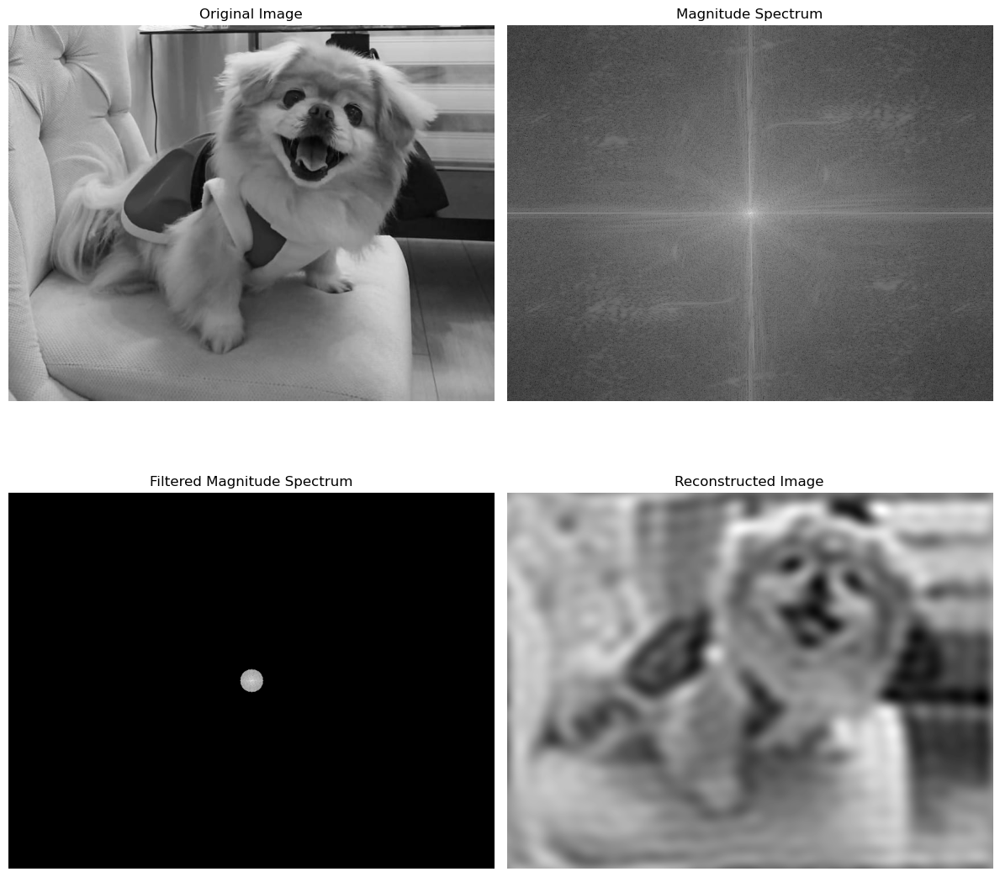

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy import fftpack

# Load an example image
image = cv2.imread("sim_data-master/images/dog.jpeg", cv2.IMREAD_GRAYSCALE) 

# Convert image to floating-point type
image_float = np.float32(image)

# Perform FFT (Fast Fourier Transform) on the image
fft_image = fftpack.fft2(image_float)

# Shift the zero frequency component to the center
fft_shifted = fftpack.fftshift(fft_image)

# Calculate the magnitude spectrum
magnitude_spectrum = np.abs(fft_shifted)

# Define frequency ranges for filtering (e.g., a small circular region)
center_row, center_col = magnitude_spectrum.shape[0] // 2, magnitude_spectrum.shape[1] // 2
radius = 20  # Adjust the radius of the circular region
y, x = np.ogrid[-center_row:magnitude_spectrum.shape[0] - center_row,
                -center_col:magnitude_spectrum.shape[1] - center_col]
mask = x**2 + y**2 <= radius**2

# Apply the mask to the magnitude spectrum
filtered_magnitude_spectrum = np.where(mask, magnitude_spectrum, 0)

# Reconstruct the image using the filtered magnitude spectrum
filtered_fft_shifted = fft_shifted * (filtered_magnitude_spectrum / (magnitude_spectrum + 1e-8))
reconstructed_image = np.real(fftpack.ifft2(fftpack.ifftshift(filtered_fft_shifted)))

# Display original image, magnitude spectrum, filtered magnitude spectrum, and reconstructed image
plt.figure(figsize=(12, 12))

plt.subplot(2, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(np.log(1 + magnitude_spectrum), cmap='gray')
plt.title('Magnitude Spectrum')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(np.log(1 + filtered_magnitude_spectrum), cmap='gray')
plt.title('Filtered Magnitude Spectrum')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(reconstructed_image, cmap='gray')
plt.title('Reconstructed Image')
plt.axis('off')

plt.tight_layout()
plt.show()